<h1><center>IMT2118 - Ciencia de Datos Geoespaciales</center></h1>
<h2><center>Tarea 2: Monitoreo del Crecimiento Urbano Mediante Percepción Remota </center></h2>



<div class="alert alert-block alert-info">

## Instrucciones generales.

&#128467; **Fecha de entrega:** viernes 26 de abril de 2024, 23:59. <br>

&#128236; **Entrega:** A través de Canvas, adjunte todos los archivos necesarios para ejecutar su código dentro de una única carpeta comprimida (.zip). Incluya el  Jupyter Notebook con el desarrollo (puede utilizar este mismo notebook), y las capas o archivos vectoriales que haya generado como parte de su análisis. El objetivo es que **el Notebook pueda correr completamente dentro de la carpeta entregada**. Si el archivo compromido supera el tamaño máximo permitido por Canvas, puede enviar un link de descarga. <br>
    

&#128013; La Tarea debe ser desarrollada en lenguaje de programación Python. En el caso de la plataforma GEE, también se acepta trabajar en Java.<br>

&#11088; En el Notebook, incluya texto explicando los pasos u operaciones desarrolladas, no sólo el código. El objetivo es que el Notebook siga un hilo narrativo, sea claro y atractivo de leer. En [este link](https://github.com/brad-do/nb-miscellany/blob/master/things_to_do_in_markdown.ipynb) puede encontrar algunos tips útiles para usar celdas de anotaciones o Markdown. <br>


&#128519; El trabajo es **invididual**, y debe seguir todos los lineamientos de integridad académica del curso. Recuerde referenciar apropiadamente todas las referencias, códigos y datos consultados para el desarrollo de su tarea.<br>
 
&#128064; Lea cuidadosamente el enunciado.
    
&#10067;  Se sugiere hacer consultas y comentarios sobre la Tarea a traves del Foro del curso creado en Canvas. 

</div>

#### Profesora: Paula Aguirre A, 2024-1.

## 1. Introducción.

La velocidad a la cual crecen las ciudades, o *tasa de urbanización*, es un importante indicador de la sustentabilidad de pueblos y ciudades. Una urbanización rápida y desorganizada puede conducir a una saturación y sobrecarga de la infraestructura pública y servicios básicos como salud, educación y transporte, lo cual conlleva a su vez pobres resultados sociales, económicos y ambientales.

El primer requisito para abordar los impactos de la urbanización acelerada es implementar un monitoreo regular de la extensión urbana. Los datasets globales de observación terrestre proveen un medio preciso y costo-efectivo para realizar esta tarea.


## 2. Datos.

Para este problema, deberá trabajar con el catálogo de datos de Google Earth Engine. Para el punto *3.9*, ud. deberá seleccionar y obtener datos vectoriales complementarios.





## 3. Problemas.

Para esta tarea, ud. definirá la zona de estudio. Elija y declare una ciudad de Chile de su preferencia. Si desea analizar la región metropolitana, puede escoger una (o más) comunas urbanas.


In [76]:
ee.Initialize()

In [77]:
panguipulli = [[-39.636080928678325, -72.35352753863144],
[-39.65452015109947, -72.35112427949957],
[-39.652669841795245, -72.3137021015892],
[-39.63211486209537, -72.31524705388826],
[-39.636080928678325, -72.35352753863144]]

for sublist in panguipulli:
    sublist.reverse()

aoi = ee.Geometry.Polygon(panguipulli)


### 3.1 Utilizando datos de Landsat 7, genere la geomedianas anuales de su zona de estudio desde el año 2000 a 2020.
Para este proceso, considere
- Descripción de la colección: https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LE07_C02_T1_L2#description
- Remoción de nubes y sombras: https://github.com/gee-community/geemap/issues/1095#issuecomment-1151812523
- Bandas a utilizar para el cálculo de la geomediana.

In [78]:
fecha_inicio = '2000-01-01'
fecha_final = '2021-01-01'

In [79]:
collection = ee.ImageCollection("LANDSAT/LE07/C02/T1_L2").filterBounds(aoi).filterDate(fecha_inicio,fecha_final).filter(ee.Filter.lte('CLOUD_COVER',20))
collection

In [80]:
def apply_scale_factors(image):
  optical_bands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
  #thermal_bands = image.select('ST_B6').multiply(0.00341802).add(149.0)
  return image.addBands(optical_bands, None, True)#.addBands(
      #thermal_bands, None, True
#  )
def fmask(image):
        # see https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC09_C02_T1_L2
        # Bit 0 - Fill
        # Bit 1 - Dilated Cloud
        # Bit 2 - Cirrus
        # Bit 3 - Cloud
        # Bit 4 - Cloud Shadow
    qaMask = image.select('QA_PIXEL').bitwiseAnd(int('11111', 2)).eq(0)

        # Apply the scaling factors to the appropriate bands.
    opticalBands = image.select('SR_B.').multiply(0.0000275).add(-0.2)

        # Replace the original bands with the scaled ones and apply the masks.
    return image.addBands(opticalBands, None, True).updateMask(qaMask)

In [81]:
#collection = collection.map(apply_scale_factors)
collection = collection.map(fmask)
collection.first()

# Bandas RGB: SR_B3, SR_B2, SR_B1

In [82]:

vis_2mt = {'min': 0,'max': 0.3, "bands": ["SR_B3", "SR_B2", "SR_B1"]}

m = geemap.Map(center= [-39.63231317082502, -72.35490082956393], zoom=10)



m.add_layer(collection.first(),vis_2mt,'ture')
m.addLayer(aoi,name='aoi')
m

Map(center=[-39.63231317082502, -72.35490082956393], controls=(WidgetControl(options=['position', 'transparent…

In [83]:
#Plan: Dividir en años -> calcular geomediana con el reducer -> visualizar...?
#Dividir en años
colecciones = []
años = ["2000-01-01","2001-01-01","2002-01-01","2003-01-01","2004-01-01","2005-01-01","2006-01-01","2007-01-01","2008-01-01",
       "2009-01-01","2010-01-01","2011-01-01","2012-01-01","2013-01-01","2014-01-01","2015-01-01","2016-01-01","2017-01-01","2018-01-01",
       "2019-01-01","2020-01-01","2021-01-01"]
for i_año in range(len(años)-1):
    print(años[i_año], años[i_año+1])
    temp_collection = ee.ImageCollection("LANDSAT/LE07/C02/T1_L2").filterDate(años[i_año], años[i_año+1]).filterBounds(aoi)#.filter(ee.Filter.lte('CLOUD_COVER',30))#.select(["SR_B1", "SR_B2","SR_B3"])
    
    colecciones.append(temp_collection.map(fmask))
    
colecciones[0]

2000-01-01 2001-01-01
2001-01-01 2002-01-01
2002-01-01 2003-01-01
2003-01-01 2004-01-01
2004-01-01 2005-01-01
2005-01-01 2006-01-01
2006-01-01 2007-01-01
2007-01-01 2008-01-01
2008-01-01 2009-01-01
2009-01-01 2010-01-01
2010-01-01 2011-01-01
2011-01-01 2012-01-01
2012-01-01 2013-01-01
2013-01-01 2014-01-01
2014-01-01 2015-01-01
2015-01-01 2016-01-01
2016-01-01 2017-01-01
2017-01-01 2018-01-01
2018-01-01 2019-01-01
2019-01-01 2020-01-01
2020-01-01 2021-01-01


In [84]:
#Reducer GeoMediana
geomediana = ee.Reducer.geometricMedian(5)
geomedianas = []
for i in range(len(colecciones)):  
    geomedianas.append(colecciones[i].select(["SR_B1", "SR_B2","SR_B3", "SR_B4", "SR_B5"]).reduce(geomediana))

geomedianas = ee.ImageCollection.fromImages(geomedianas)
geomedianas

In [85]:

videoArgs = {'dimensions': 500,
             'region': aoi,
             'framesPerSecond': 8,
             'min': 0,
             'max': 0.3,
            'bands': ["geometric_median_2", "geometric_median_1", "geometric_median_0"]}


print(geomedianas.getVideoThumbURL(videoArgs));
geomedianas

https://earthengine.googleapis.com/v1/projects/earthengine-legacy/videoThumbnails/a2342ed23b6b4029f788076538071cc5-1962837815282b56e53e9f4d41265448:getPixels




### 3.2 Genere un split map o timelapse con la imagen (geomediana) RGB de la ciudad estudiada, para el primer y último año analizados. Comente: ¿qué cambios puede apreciar en la zona urbana?




In [86]:
geomediana = ee.Reducer.geometricMedian(3)
geomedianas_2 = [colecciones[0].select(["SR_B1", "SR_B2","SR_B3"]).reduce(geomediana),colecciones[-1].select(["SR_B1", "SR_B2","SR_B3"]).reduce(geomediana)]
geomedianas_2 = ee.ImageCollection.fromImages(geomedianas_2)


videoArgs = {'dimensions': 500,
             'region': aoi,
             'framesPerSecond': 1,
             'min': 0,
             'max': 0.3, 'bands': ["geometric_median_2", "geometric_median_1", "geometric_median_0"]}


print(geomedianas_2.getVideoThumbURL(videoArgs));

https://earthengine.googleapis.com/v1/projects/earthengine-legacy/videoThumbnails/8ef73de2b4d3f63798d00393443d807e-0f540a53b0ced4080b9e0aee5991898a:getPixels


# Se nota la expansión urbana alrededor de la ciudad, sobretodo al norte de esta, también se aprecia una figura al noroeste de color rojo/anaranjado, que al ver en google maps se trata de un liceo.

### 3.3 Investigue sobre índices espectrales que permitan identificar y seleccionar áreas construidas o urbanizadas.
- Escoja un índice que pueda ser calculado con las imágenes seleccionadas en el punto 3.1. Incluya sus fuentes y referencias.
- Escriba un breve párrafo con la definición y justificación de dicho índice, y especifique claramente la fórmula de cálculo.

**Nota:**  De aquí en adelante, nos referiremos a este índice como **IAU** (Índice de Área Urbana).
# Respuesta:

Encontre el UI, y el NDBI.

El UI o Urban Index de Kawamura tambiénnos permitirá obtener mapas análogos incorporando la banda VNIR en nuestra relación:

### UI= (SWIR-VNIR)/ (SWIR+VNIR)

### NDBI= (SWIR-NIR)/ (SWIR+NIR)

Elegiré el NDBI como **IAU**, ya que landsat 7 tiene las bandas SR_B4 y SR_B5, las cuales son NIR Y SWIR respectivamente, haciendo posible el cálculo

https://www.gisandbeers.com/calculo-indice-ndbi-analisis-urbanisticos/


### 3.4 Calcule el IAU para la geomediana de cada año, y genere un mapa o animación que permita visualizar la evolución de la extensión urbana como función del tiempo.
- Incluya en su mapa la cartografía del censo 2017. En particular, puede utilizar los polígonos de las zonas urbanas.



In [87]:
def calculate_ndbi(collection_images):
    ndbi_collection = collection_images.map(lambda image: image.expression(
        '(SWIR - NIR) / (SWIR + NIR)',
        {
            'SWIR': image.select('geometric_median_4'),
            'NIR': image.select('geometric_median_3')
        }
    ))

    return ndbi_collection


In [88]:
ndbi = calculate_ndbi(geomedianas)
ndbi.first()

In [89]:
censal = gpd.read_file("R14/LIMITE_URBANO_CENSAL_C17.shp")
censal = censal.to_crs("EPSG:4326")
censal = censal[censal["URBANO"]=="PANGUIPULLI"]
nuevo_aoi = censal.geometry.iloc[0]
from shapely.geometry import mapping
poly_mapped = mapping(nuevo_aoi)

poly_coordinates = poly_mapped['coordinates'][0]

poly_ = [[coords[0],coords[1]] for coords in poly_coordinates]

nuevo_aoi = ee.Geometry.Polygon(poly_)
censal.explore()

In [90]:
censal.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [91]:

vis_2mt = {'min': -1,'max': 1}#, 'palette': ["93a3b1","7c898b","636564","4c443c","322214"]}

m = geemap.Map(center= [-39.644925979685596, -72.33467565000001], zoom=14)



m.add_layer(ndbi,vis_2mt,'ture')
# m.addLayer(nuevo_aoi,name='aoi')
m

Map(center=[-39.644925979685596, -72.33467565000001], controls=(WidgetControl(options=['position', 'transparen…

In [92]:
videoArgs = {'dimensions': 500,
             'region': nuevo_aoi,
             'framesPerSecond': 7,
             'min': -1,
             'max': 1, 
            'palette': ["00B100","40852E","80595C","BF2C89","FF00B7"]}

print(ndbi.getVideoThumbURL(videoArgs));

https://earthengine.googleapis.com/v1/projects/earthengine-legacy/videoThumbnails/e060301f7ac5a75d47abd30d25151e09-496175b40924b025b5022d08466a10a5:getPixels


### 3.5 Calcule para cada año la superficie urbana (en km^2), y grafique como serie de tiempo.



In [93]:
ndbi.first().bandNames()

In [94]:
#Recibir la cosa -> filtrarla por todos lados (fecha y área) -> maskearla
#->sacar geomediana de las bandas para el cálculo del Ndbi -> calcular el ndbi -> exportar la imagen del ndbi
años = ["2000-01-01","2001-01-01","2002-01-01","2003-01-01","2004-01-01","2005-01-01","2006-01-01","2007-01-01","2008-01-01",
       "2009-01-01","2010-01-01","2011-01-01","2012-01-01","2013-01-01","2014-01-01","2015-01-01","2016-01-01","2017-01-01","2018-01-01",
       "2019-01-01","2020-01-01","2021-01-01"]
reducer_geom = ee.Reducer.geometricMedian(2)
for i_año in range(len(años)-1):
    print(años[i_año], años[i_año+1])
    temp_collection = ee.ImageCollection("LANDSAT/LE07/C02/T1_L2").filterDate(años[i_año], años[i_año+1])
    temp_collection = temp_collection.map(fmask)
    i_geomediana = temp_collection.select(["SR_B4","SR_B5"]).reduce(reducer_geom)
    ndbi = i_geomediana.normalizedDifference().rename('ndbi')
    # ndbi = ndbi.addBands(ee.Image.pixelArea())
    ndbi = ee.Image.pixelArea().addBands(ndbi.select('ndbi'))
    geemap.ee_export_image(ndbi.reproject("EPSG:32719", scale=50), scale=50, filename=f'ndbi/{años[i_año]}.tif', region=nuevo_aoi)  

2000-01-01 2001-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2000-01-01.tif
2001-01-01 2002-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2001-01-01.tif
2002-01-01 2003-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2002-01-01.tif
2003-01-01 2004-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2003-01-01.tif
2004-01-01 2005-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2004-01-01.tif
2005-01-01 2006-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2005-01-01.tif
2006-01-01 2007-01-01
Generating URL ...
Please wait ...
Data downloaded to /home/cristobal/geoespaciales/Notebooks/t2/ndbi/2006-01-01.tif
2007-01-01 2008-01-01
Gener

In [95]:
import rasterio
from rasterio.plot import show

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


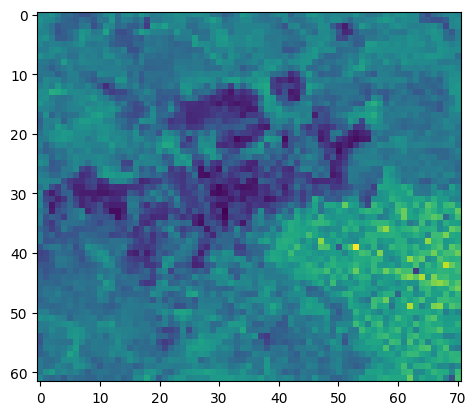

In [96]:
example = rasterio.open(f'ndbi/2020-01-01.tif').read(2)
show(example)
plt.show()

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


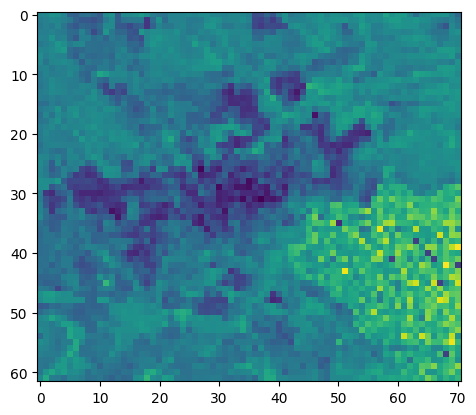

In [97]:
example = rasterio.open(f'ndbi/2010-01-01.tif')
show(example.read(2))
plt.show()

In [98]:
threshold = 0.4
# show(example)
# plt.show()

areas = []
for fecha in años[:len(años)-1]:
    area_total = 0
    raster_ndbi = rasterio.open(f'ndbi/{fecha}.tif').read()[1]
    raster_area = rasterio.open(f'ndbi/{fecha}.tif').read()[0]
    contador = 0
    
    for i in range(len(raster_ndbi)):
        for j in range(len(raster_ndbi[i])):
            if raster_ndbi[i][j] > threshold:
                print(raster_ndbi[i][j], raster_area[i][j])
                contador += 1
                area_total += raster_area[i][j]
                

    areas.append(area_total)

print(areas)
            
        

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

0.47814953 2496.9414
0.45283872 2496.943
0.45085433 2497.0117
0.42812267 2497.0134
0.4239821 2497.0186
0.41118425 2496.9414
0.4030655 2496.9993
0.44633108 2497.0117
0.42188242 2496.9485
0.4112711 2496.9644
0.4349242 2497.0134
0.5056824 2496.9238
0.50403565 2496.9255
0.4116957 2496.9272
0.4820537 2496.929
0.5004358 2496.9307
0.46151528 2496.9414
0.4043135 2496.9502
0.44106334 2496.952
0.40554816 2496.9941
0.42467266 2497.0134
0.4196897 2496.9219
0.4664772 2496.9238
0.451106 2496.9255
0.45567936 2496.929
0.44663453 2496.9414
0.42464504 2496.966
0.4210831 2496.9905
0.40402964 2496.9924
0.44033372 2496.9414
0.4053515 2496.9573
0.43358728 2496.9307
0.4086212 2496.9941
0.4565863 2497.0063
0.53420717 2496.9307
0.49277124 2496.9326
0.40329245 2496.9624
0.40223733 2496.9924
0.4370904 2497.0012
0.41045985 2497.003
0.44750503 2497.0063
0.4034286 2496.9888
0.42841524 2496.9905
0.42585617 2496.9958
0.41129643 2497.0063
0.43023968 2497.003
0.49826464 2497.0046
0.55098575 2497.0063
0.41479015 2496.92

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

0.45207813 2497.0117
0.4155142 2497.0168
0.52438027 2497.0203
0.44911557 2497.0222
0.65388966 2497.024
0.63848513 2497.0256
0.752007 2497.0273
0.4895481 2497.029
0.5704192 2497.0308
0.60503334 2497.0327
0.77608216 2497.0344
0.48296842 2496.915
0.4458738 2496.9185
0.47313395 2496.943
0.5136893 2496.9448
0.42629308 2496.9749
0.48629025 2496.9783
0.4417214 2496.98
0.44562095 2497.008
0.47836086 2497.0098
0.49697074 2497.0117
0.40122932 2497.0151
0.41256803 2497.0168
0.5738711 2497.0186
0.47245735 2497.0203
0.44798404 2497.0222
0.70622927 2497.024
0.50124174 2497.029
0.60274434 2497.0308
0.714086 2497.0327
0.5170245 2497.0344
0.5068883 2496.913
0.56615806 2496.943
0.44489193 2496.9485
0.41318014 2496.9502
0.498962 2496.9783
0.50008214 2496.98
0.4354823 2497.0063
0.4200794 2497.008
0.459608 2497.0117
0.46010482 2497.0134
0.48963818 2497.0151
0.46521935 2497.0168
0.49810064 2497.0186
0.47044238 2497.0203
0.5522704 2497.0222
0.48341036 2497.024
0.7206959 2497.0256
0.59979314 2497.0273
0.42910

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as 

<Axes: xlabel='año', ylabel='area'>

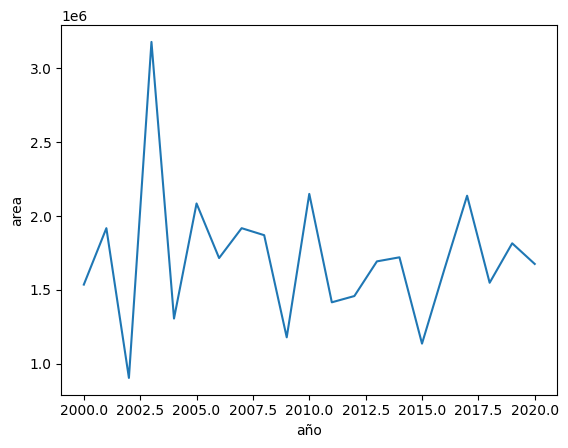

In [99]:
import seaborn as sns
años_real = [int(año[:4]) for año in años[:len(años)-1]]
data = {"año":años_real, "area": areas}

sns.lineplot(pd.DataFrame.from_dict(data), x="año", y="area")

# threshold es un parámetro a ajustar, ya que el ndbi debería funcionar con un threshold más grande, pero por falta de tiempo, no alcancé a encontrar que está causando esto, mis hipótesis son que la zona tiene poca urbanización, aunque puede haber un error en el cálculo

### 3.6 En base al índice calculado, identifique (si existen) aquellas zonas de crecimiento urbano exagerado o "hot spots", y también zonas de declive urbano o "cold spots".




Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


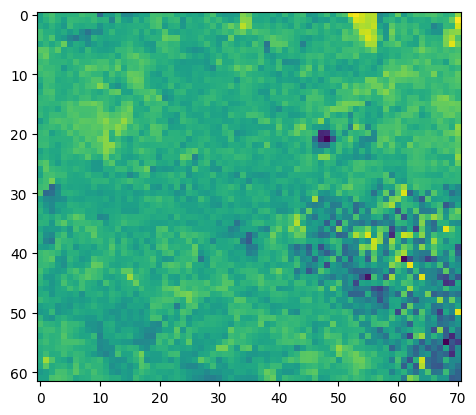

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


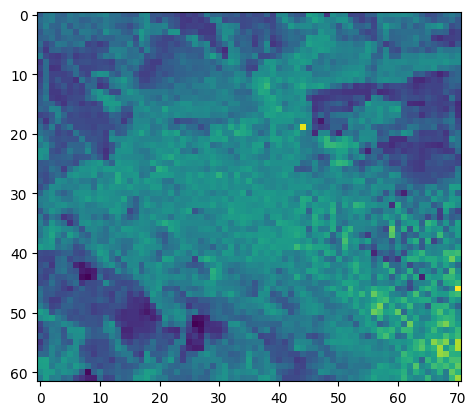

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


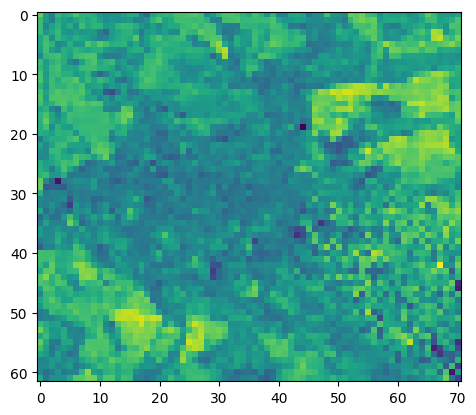

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


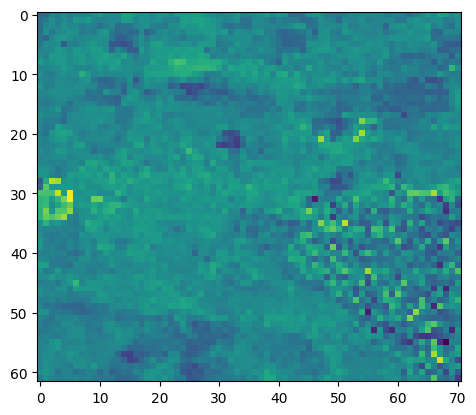

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


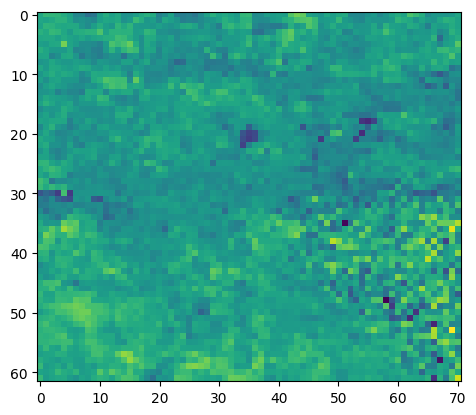

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


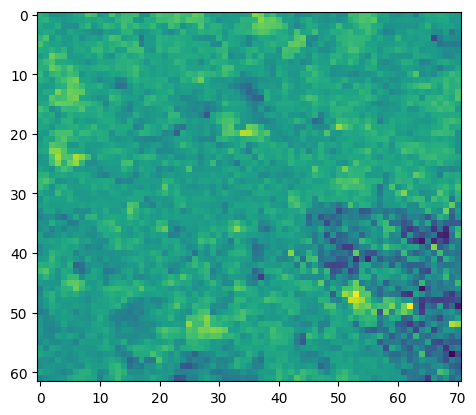

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


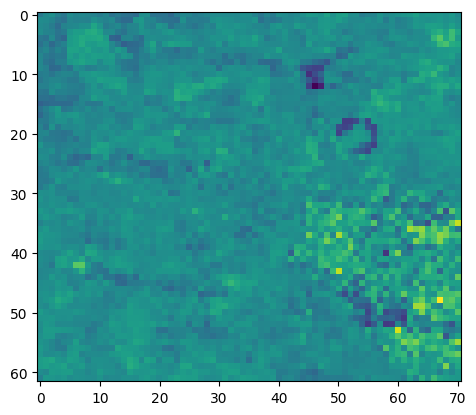

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


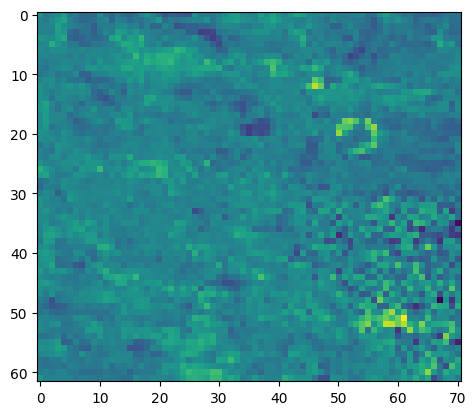

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


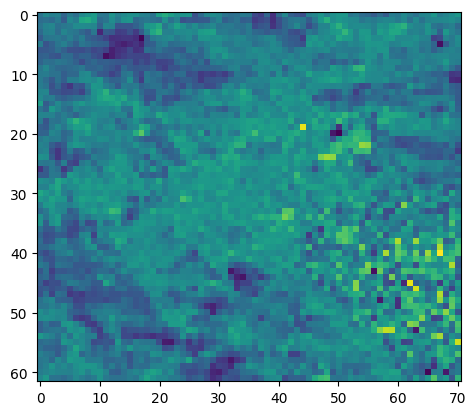

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


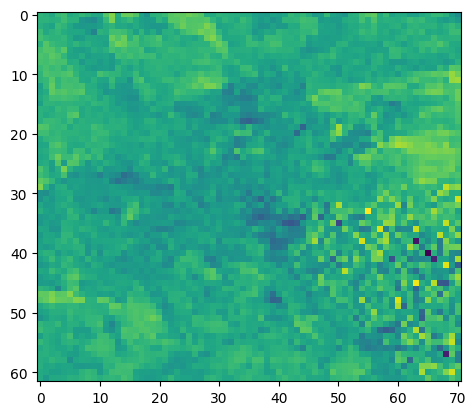

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


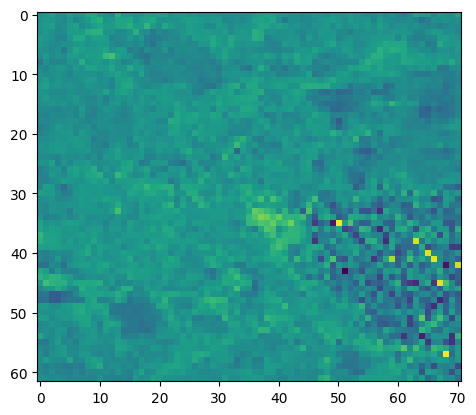

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


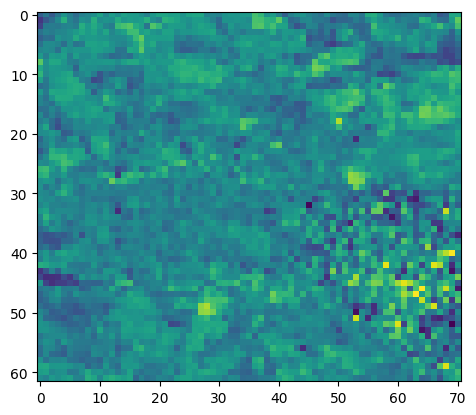

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


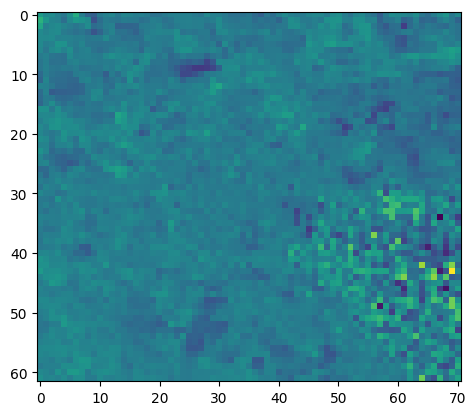

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


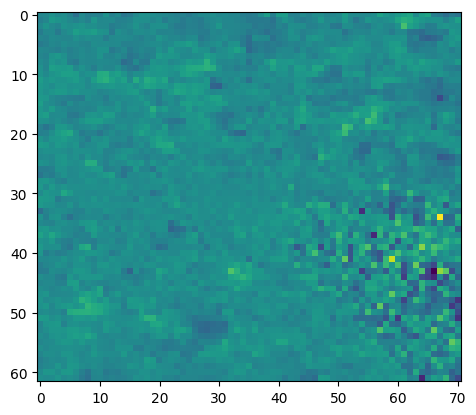

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


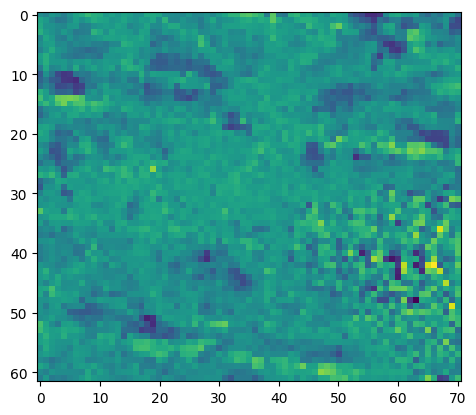

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


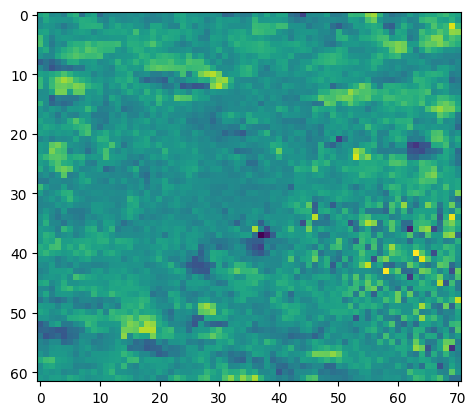

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


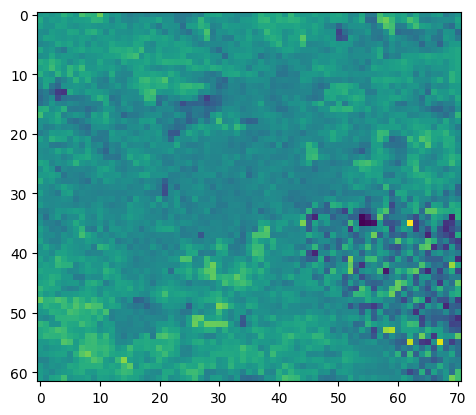

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


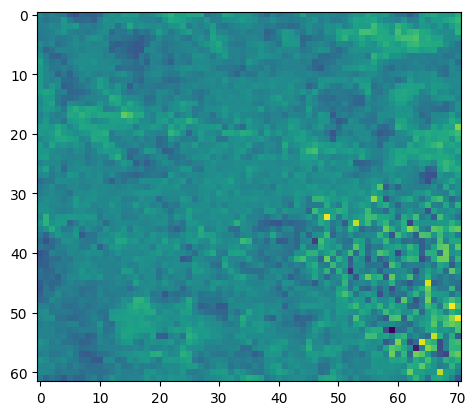

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


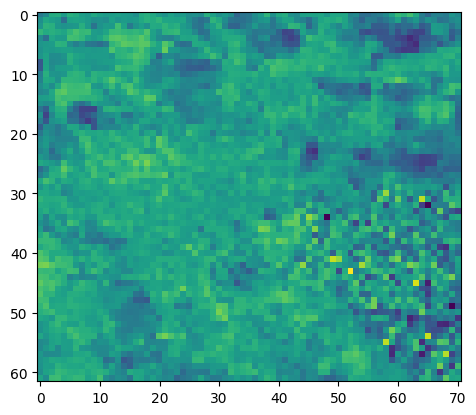

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


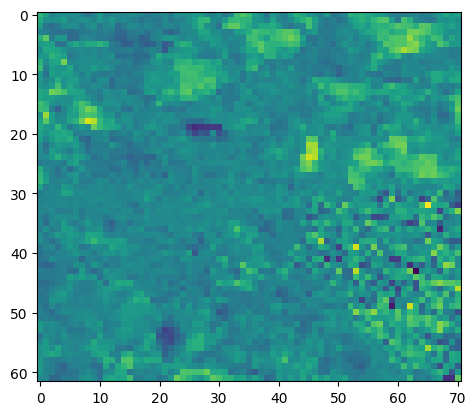

In [100]:
diferencia_anual = []
for año in range(len(años[:len(años)-2])):
    raster_año_actual = rasterio.open(f'ndbi/{años[año]}.tif').read(2)
    raster_año_sig = rasterio.open(f'ndbi/{años[año+1]}.tif').read(2)
    diferencia_anual.append(raster_año_sig - raster_año_actual)
    show(raster_año_sig - raster_año_actual)
    plt.show()

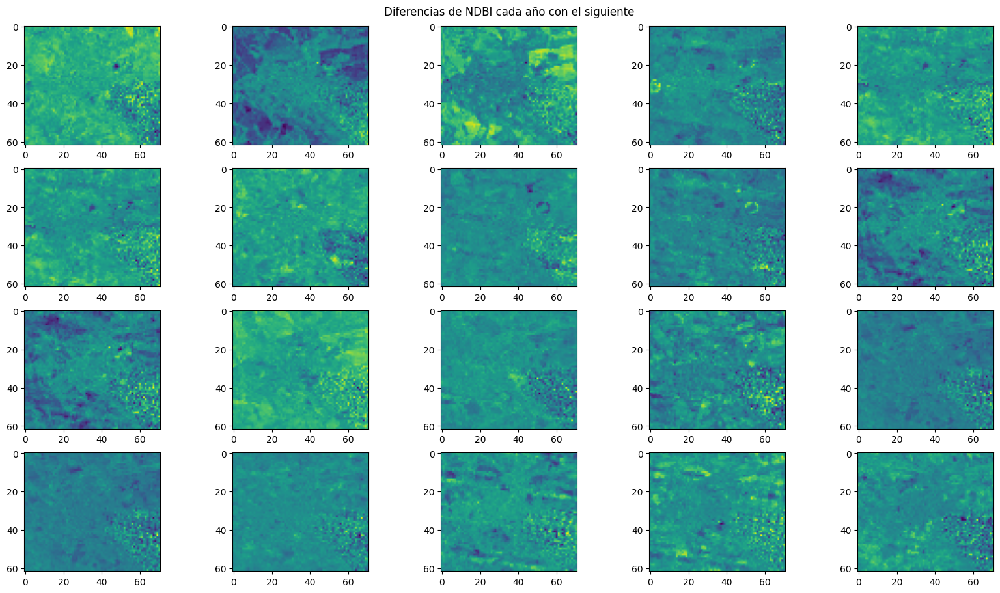

In [101]:

fig, axs = plt.subplots(ncols=5, nrows=4, figsize=(16, 9),
                        layout="constrained")
# add an artist, in this case a nice label in the middle...
for i in range(4):
    for j in range(5):
        show(diferencia_anual[(i*4)+j], ax=axs[i][j])

fig.suptitle('Diferencias de NDBI cada año con el siguiente')
plt.show()

Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.
Warning 1: TIFFReadDirectory:Sum of Photometric type-related color channels and ExtraSamples doesn't match SamplesPerPixel. Defining non-color channels as ExtraSamples.


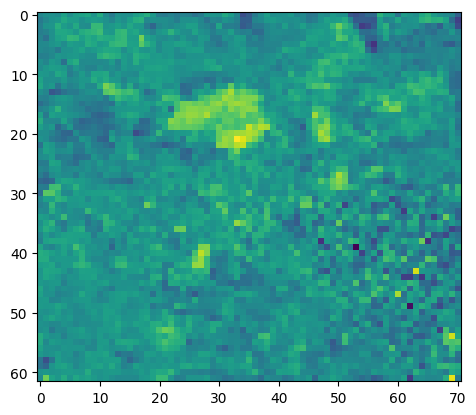

In [102]:

raster_año_actual = rasterio.open(f'ndbi/{años[0]}.tif').read(2)
raster_año_sig = rasterio.open(f'ndbi/{años[-2]}.tif').read(2)
diferencia_anual.append(raster_año_actual- raster_año_sig)
show(raster_año_actual- raster_año_sig)
plt.show()

# Se aprecian algunos hotspots, como en el año 2019-2020, se aprecian algunos hotspots. Lamentablemente hay bastantes falsos positivos, probablemente dado el problema con 3shold, por otra parte, si comparamos el 2000 con el 2020, podemos ver directamente la zona en donde más crecimiento urbano hubo en el centro arriba de panguipulli

---
 A nivel global, existen varios proyectos orientados a mapear los asentamientos humanos en base a percepción remota, como por ejemplo *The Global Human Settlement Layer*. Éste es un proyecto de la Comisión Europea que crea datos geográficos globales sobre la evolución de la ocupación humana en la Tierra, en forma de mapas de densidad de población, mapas de urbanización y mapas de asentamientos. Este producto se encuentra disponible en GEE, y está descrito en el siguiente link:
 
 https://developers.google.com/earth-engine/datasets/catalog/JRC_GHSL_P2023A_GHS_BUILT_C#description
 

### 3.7 Considere ahora solamente el año 2018. Para este año, compare el raster de área urbana generado a partir del IAU, con los datos de GHSL.
- Considere la resolución espacial de cada dataset, y resamplee en caso de ser necesario.
- Evalúe las diferencias en términos de área  y geometría de la extensión urbana (intersección / diferencia) 




In [103]:
ghsl = ee.ImageCollection("JRC/GHSL/P2023A/GHS_BUILT_C").filterBounds(nuevo_aoi).select("built_characteristics")

vis_2mt = {}

m = geemap.Map(center= [-39.644925979685596, -72.33467565000001], zoom=14)



m.add_layer(ghsl.first(),vis_2mt,'ture')
m.addLayer(nuevo_aoi,name='aoi')
m

Map(center=[-39.644925979685596, -72.33467565000001], controls=(WidgetControl(options=['position', 'transparen…

### 3.8 Otro forma de monitorear el crecimiento urbano, es mediante capas de capas de clasificación de usos de suelo, o LULC (land use/land cover). Un ejemplo reciente de este tipo de datos es el dataset Dynamic World: https://dynamicworld.app/
- Identifique uno (o más) puntos de la ciudad identificados previamente en el punto 3.6 como zonas de crecimiento o declive urbano.
- Para estos mismos puntos, genere series de tiempo con la probabilidad de clases de uso de suelo en base al dataset Dynamic World.
- Analice la serie de tiempo y comente: ¿son coherentes los resultados con su análisis previo en base al IAU?



In [104]:
dw = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1").filterBounds(nuevo_aoi).filterDate(años[-3],años[-2])


vis_2mt = {"min": 0, "max": 1}

m = geemap.Map(center= [-39.644925979685596, -72.33467565000001], zoom=14)



m.add_layer(dw.select("built"),vis_2mt,'ture')
m.addLayer(nuevo_aoi,name='aoi')
m

Map(center=[-39.644925979685596, -72.33467565000001], controls=(WidgetControl(options=['position', 'transparen…

In [105]:
dw

In [106]:
colecciones = []
años = ["2016-01-01","2017-01-01","2018-01-01",
       "2019-01-01","2020-01-01","2021-01-01"]
for i_año in range(len(años)-1):
    print(años[i_año], años[i_año+1])
    temp_collection = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1").filterDate(años[i_año], años[i_año+1]).filterBounds(nuevo_aoi)#.filter(ee.Filter.lte('CLOUD_COVER',30))#.select(["SR_B1", "SR_B2","SR_B3"])
    colecciones.append(temp_collection)

geomediana = ee.Reducer.geometricMedian(10)
geomedianas = []
for i in range(len(colecciones)):  
    geomedianas.append(colecciones[i].reduce(geomediana))

geomedianas = ee.ImageCollection.fromImages(geomedianas)


videoArgs = {'dimensions': 250,
             'region': nuevo_aoi,
             'framesPerSecond': 1,
             'min': 0,
             'max': 10, 'bands':["geometric_median_6"]}#, 'palette': ["0E1167","4A434D","877534","C3A71A","FFD900"]}
print(geomedianas.getVideoThumbURL(videoArgs));

2016-01-01 2017-01-01
2017-01-01 2018-01-01
2018-01-01 2019-01-01
2019-01-01 2020-01-01
2020-01-01 2021-01-01
https://earthengine.googleapis.com/v1/projects/earthengine-legacy/videoThumbnails/c6aee5068de53adc3753ae042e3ff3ef-976bbb2b2fc3d04c99529911558a9a62:getPixels


# De acuerdo a la parte 3.6, la zona centro-norte se podría considerar un hotspot, algo que se aprecia también en la serie de tiempo.


### 3.9 Finalmente, muchas veces constatamos que la urbanización ocurre en forma más acelerada que el desarrollo de infraestructura pública y servicios urbanos básicos como educación, salud, agua potable, transporte público, etc., lo cual conlleva problemas de calidad de vida y desigualdad socioeconómica, entre otros. ¿Es este el caso de su ciudad de estudio?
- Seleccione **dos** tipos de infraestructura o servicios a analizar, como por ejemplo: escuelas, hospitales, transporte público, redes de agua potable, redes de electricidad, etc. (puede sugerir otras).
- Para dichos servicios, busque y obtenga datos georreferenciados que le permitan analizar su evolución temporal desde el año 2000 (o algún año posterior) hasta el 2022. Especifique claramente los datos utilizados y su fuente.
- Analice estos datos en conjunto con su análisis previo del IAU. ¿Puede identificar si hay coherencia entre las zonas de mayor crecimiento urbano, y el desarrollo de servicios urbanos? ¿Hay un desfase temporal entre la urbanización, y la expansión de la infraestructura urbana básica? Comente en base a sus resultados.

*Algunas plataformas de utilidad:*
- DEIS MINSAL: https://deis.minsal.cl/
- MINEDUC : https://datosabiertos.mineduc.cl/
- SECTRA: https://www.sectra.gob.cl/datos_informacion_espacial/datos_informacion_espacial.htm
- SISS: https://www.siss.gob.cl/586/w3-propertyvalue-6323.html
- Geoportal MINVU: https://ide.minvu.cl/plataformas
